In [24]:
import pandas as pd
import seaborn as sns
from plotly import express as px
from matplotlib import pyplot as plt
from matplotlib import gridspec 

import numpy as np
import folium
from folium.plugins import HeatMap
from folium import plugins


In [4]:
pd.read_csv('../App/Data/kc_house_data.csv')

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,20140521T000000,360000.0,3,2.50,1530,1131,3.0,0,0,...,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,6600060120,20150223T000000,400000.0,4,2.50,2310,5813,2.0,0,0,...,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,1523300141,20140623T000000,402101.0,2,0.75,1020,1350,2.0,0,0,...,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,291310100,20150116T000000,400000.0,3,2.50,1600,2388,2.0,0,0,...,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287


In [5]:
data=pd.read_csv('../App/Data/kc_house_data.csv')

In [13]:
data['bedrooms'].max()

33

In [14]:
data[data['bedrooms'] == data['bedrooms'].max()]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
15870,2402100895,20140625T000000,640000.0,33,1.75,1620,6000,1.0,0,0,...,7,1040,580,1947,0,98103,47.6878,-122.331,1330,4700


In [15]:
data[data['bathrooms'] ==data['bathrooms'].max()]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7252,6762700020,20141013T000000,7700000.0,6,8.0,12050,27600,2.5,0,3,...,13,8570,3480,1910,1987,98102,47.6298,-122.323,3940,8800
12777,1225069038,20140505T000000,2280000.0,7,8.0,13540,307752,3.0,0,4,...,12,9410,4130,1999,0,98053,47.6675,-121.986,4850,217800


In [16]:
data['sqft_living'].max()

13540

In [17]:
valores={'A':data['id'],'B':data['price']}

In [18]:
for v in valores.values():
    

IndentationError: expected an indented block (Temp/ipykernel_2240/192086003.py, line 2)

In [19]:
valores={'Habitaciones':data['bedrooms'],'Pisos':data['floors'],'Baños':data['bathrooms']}
for k,v in valores.items():
     if 'Habitaciones' in OptFiltro:
          st.write(data[v==v.max()])
          st.write(data[v==v.max()].shape[0])
          st.write(v.mean())
          st.write(v.mode())
          st.write(v.median())
          st.write(v.min())
          st.write(v.max())


NameError: name 'OptFiltro' is not defined

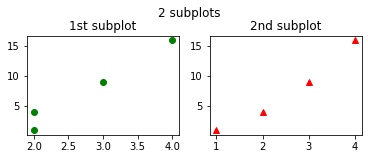

In [23]:
# Importar biblioteca numpy y biblioteca matplotlib.pyplot
import numpy as np
import matplotlib.pyplot as plt

# Cree un nuevo subgrafo, la cuadrícula es 1x2, el número de serie es 1, el primer número es el número de filas, el segundo número es el número de columnas, lo que indica la disposición de los subgrafos, y el tercer número es el número de serie del subgrafo
plt.subplot(2, 2, 1)
plt.plot([2,2,3,4], [1,4,9,16], "go") # ir significa círculo verde, punto verde
# Establecer el título de la subimagen
plt.title("1st subplot")

# Cree un nuevo subgrafo, cuadrícula 1x2, número de secuencia 2
plt.subplot(2, 2, 2)
plt.plot([1,2,3,4], [1,4,9,16], "r^") # r ^ significa el triángulo rojo
# Establecer el título de la subimagen
plt.title("2nd subplot")

# Establecer título
plt.suptitle("2 subplots")

# Mostrar
plt.show()

In [57]:
# Calculate approximated center point for our map view
center = [data['lat'].mean(), data['long'].mean()]
# locations
locations = list(zip(data['lat'], data['long']))
# Setup our map
map2 = folium.Map(location=center, zoom_start=12,width="%100",height="%100")


# Setup our heatmap layer
heatMap = HeatMap(zip(data['lat'], data['long']),
                   min_opacity=0.1,
                   max_val=5,
                   radius=5, blur=15,
                   max_zoom=1)

# minimap
minimap = plugins.MiniMap()


for i in range(len(locations)):
    folium.CircleMarker(location=locations[i],radius=1).add_to(map2)
    #bloquea el mapa con tantos datos
    ##folium.Marker(location=locations[i], popup =(data['price'])).add_to(map2)    
    

# Adds the headmap and minimap to the map result
map2.add_child(heatMap)
map2.add_child(minimap)

map2



C:\Users\WILLIAM\AppData\Local\Temp/ipykernel_7896/1201387035.py:10: UserWarning: The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.
  heatMap = HeatMap(zip(data['lat'], data['long']),


In [ ]:
min_price=data["price"].min()
max_price=data["price"].max()

In [50]:
data['price'].describe().to_frame()

,price
count,2.161300e+04
mean,5.400881e+05
std,3.671272e+05
min,7.500000e+04
25%,3.219500e+05
50%,4.500000e+05
75%,6.450000e+05
max,7.700000e+06


In [51]:
data['bedrooms'].describe().to_frame()

,bedrooms
count,21613.000000
mean,3.370842
std,0.930062
min,0.000000
25%,3.000000
50%,3.000000
75%,4.000000
max,33.000000


In [48]:
data.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')